In [ ]:
# ## ==============================
# ## FOR GENERATE FUSED IMAGES ONLY
# ## ==============================

import os
import random
import torch
from PIL import Image
from torchvision import transforms
import numpy as np

# def preprocess_image(image_path: str, height_width: int = 256) -> torch.Tensor:
#     transform = transforms.Compose([
#         transforms.Resize((height_width, height_width)),
#         transforms.ToTensor()
#     ])
#     image = Image.open(image_path).convert("RGB")
#     image = transform(image)
#     return image

# Function to load and preprocess images
def load_image(image_path: str, height_width: int = 256) -> torch.Tensor:
    image = Image.open(image_path).convert("RGB")  
    transform = transforms.Compose([
        transforms.Resize((height_width, height_width)),
        transforms.ToTensor(),  
    ])
    image_tensor = transform(image) * 255  
    return image_tensor.to(torch.uint8)


# Function to display an image
def plot_image(ax, image: torch.Tensor, title: str):
    image_np = image.permute(1, 2, 0).byte().numpy()  
    ax.imshow(image_np)
    ax.set_title(title)
    ax.axis('off')  

    
## Combine images pixel wise
# def concatenate_images(img1: torch.Tensor, img2: torch.Tensor) -> torch.Tensor:
#     combined_image_pixel_wise = torch.zeros_like(img1)
#     combined_image_pixel_wise[:, 0::2, ::2] = img1[:, 0::2, ::2]    # img1 even rows, even cols
#     combined_image_pixel_wise[:, 0::2, 1::2] = img2[:, 0::2, 1::2]  # img2 even rows, odd cols
#     combined_image_pixel_wise[:, 1::2, ::2] = img2[:, 1::2, ::2]    # img2 odd rows, even cols
#     combined_image_pixel_wise[:, 1::2, 1::2] = img1[:, 1::2, 1::2]  # img1 odd rows, odd cols
#     return combined_image_pixel_wise

# Combining images using MSB
def concatenate_images(img1: torch.Tensor, img2: torch.Tensor) -> torch.Tensor:
    img1 = img1.to(torch.uint8)
    img2 = img2.to(torch.uint8)
    combined_image_pixel_wise = torch.zeros_like(img1)
    img1_msb = img1 & 0xF0  # Most significant 4 bits of img1
    img2_msb = img2 & 0xF0  # Most significant 4 bits of img2
    combined_image_pixel_wise[:, ::2, ::2] = (img1_msb[:, ::2, ::2] | (img2_msb[:, ::2, ::2] >> 4))         # img1 MSBs in MSBs, img2 MSBs in LSBs
    combined_image_pixel_wise[:, ::2, 1::2] = (img2_msb[:, ::2, 1::2] | (img1_msb[:, ::2, 1::2] >> 4))      # img2 MSBs in MSBs, img1 MSBs in LSBs
    combined_image_pixel_wise[:, 1::2, ::2] = (img1_msb[:, 1::2, ::2] | (img2_msb[:, 1::2, ::2] >> 4))      # img1 MSBs in MSBs, img2 MSBs in LSBs
    combined_image_pixel_wise[:, 1::2, 1::2] = (img2_msb[:, 1::2, 1::2] | (img1_msb[:, 1::2, 1::2] >> 4))   # img2 MSBs in MSBs, img1 MSBs in LSBs
    return combined_image_pixel_wise

def save_image(tensor_image: torch.Tensor, save_path: str) -> None:
    image_np = tensor_image.squeeze().numpy()
    image_np = np.transpose(image_np, (1, 2, 0))  # (C, H, W) -> (H, W, C)
    image_pil = Image.fromarray((image_np ).astype(np.uint8)) 
    image_pil.save(save_path)

def process_and_concatenate_images(image_dir: str, save_dir: str, no_of_diff_images_to_fuse : int, height_width: int = 256) -> None:
    image_files = [f for f in os.listdir(image_dir) if f.endswith(('.png', '.jpg', '.jpeg', '.JPEG'))]
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
    for image_file in image_files:
        image_path = os.path.join(image_dir, image_file)
        img1 = load_image(image_path, height_width)
        random_images = random.sample([f for f in image_files if f != image_file], no_of_diff_images_to_fuse)
        for i, random_image_file in enumerate(random_images):
            random_image_path = os.path.join(image_dir, random_image_file)
            img2 = load_image(random_image_path, height_width)
            concatenated_image = concatenate_images(img1, img2)
            save_path = os.path.join(save_dir, f"concatenated_{os.path.splitext(image_file)[0]}_{random_image_file}")
            save_image(concatenated_image, save_path)
            print(f"Saved: {save_path}")

image_dir = './../preprocessed_datasets/apple_orange'
save_dir = './../preprocessed_datasets/apple_orange_concatenated'
no_of_diff_images_to_fuse = 2

# process_and_concatenate_images(image_dir, save_dir, no_of_diff_images_to_fuse)


In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt
from typing import Tuple
import torchvision.models as models
import torchvision.transforms as T
import numpy as np
import os

print("Cuda available :", torch.cuda.is_available())
print("cuda version : ", torch.backends.cudnn.version())
print("No of GPU : ", torch.cuda.device_count())
for i in range(torch.cuda.device_count()):
    print(f"Device {i} Name: ", torch.cuda.get_device_name(i))

Cuda available : True
cuda version :  8907
No of GPU :  1
Device 0 Name:  NVIDIA GeForce GTX 1650 with Max-Q Design


In [3]:
# Get image inputs and preprocess
def preprocess_images(image_path1: str, image_path2: str, height_width: int = 256) -> Tuple[torch.Tensor, torch.Tensor]:
    transform = transforms.Compose([
        transforms.Resize((height_width, height_width)),
        transforms.ToTensor()
    ])
    image1 = Image.open(image_path1).convert("RGB")
    image2 = Image.open(image_path2).convert("RGB")
    print("Shape of Image 1: ", image1.size)
    print("Shape of Image 2: ", image2.size)
    image1 = transform(image1)
    image2 = transform(image2)
    print("Shape of Reshaped Image 1: ", image1.shape)
    print("Shape of Reshaped Image 2: ", image2.shape)
    return image1, image2

def show_image(image: torch.Tensor) -> None:
    image_np = image.squeeze().detach().numpy()
    image_np = image_np.transpose(1, 2, 0)  # (C, H, W) -> (H, W, C)
    plt.imshow(image_np)
    plt.axis('off')

# Define a function to display an image on a given axis
def plot_image(ax, image: torch.Tensor, title: str):
    image_np = image.squeeze().detach().numpy()
    image_np = image_np.transpose(1, 2, 0)  # (C, H, W) -> (H, W, C)
    ax.imshow(image_np)
    ax.set_title(title)
    ax.axis('off')

image_path1 = './original_images/fuse1.JPEG'
image_path2 = './original_images/fuse2.JPEG'
img1, img2 = preprocess_images(image_path1, image_path2)

Shape of Image 1:  (500, 500)
Shape of Image 2:  (324, 500)
Shape of Reshaped Image 1:  torch.Size([3, 256, 256])
Shape of Reshaped Image 2:  torch.Size([3, 256, 256])


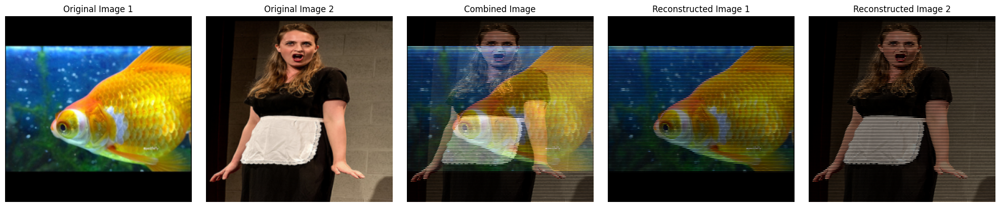

In [22]:
### ROW WISE

# Function to combine images pixel-wise
def combine_images_row_wise(img1: torch.Tensor, img2: torch.Tensor) -> torch.Tensor:
    combined_image_row_wise = torch.zeros_like(img1)
    combined_image_row_wise[:, ::2, :] = img1[:, ::2, :]
    combined_image_row_wise[:, 1::2, :] = img2[:, 1::2, :]
    return combined_image_row_wise

# Function to reconstruct images from combined image
def reconstruct_images_row_wise(combined_image_row_wise: torch.Tensor) -> Tuple[torch.Tensor, torch.Tensor]:
    img1_reconstructed_row_wise = torch.zeros_like(combined_image_row_wise)
    img2_reconstructed_row_wise = torch.zeros_like(combined_image_row_wise)
    img1_reconstructed_row_wise[:, ::2, :] = combined_image_row_wise[:, ::2, :]
    img2_reconstructed_row_wise[:, 1::2, :] = combined_image_row_wise[:, 1::2, :]
    return img1_reconstructed_row_wise, img2_reconstructed_row_wise


combined_image_row_wise = combine_images_row_wise(img1, img2)
img1_reconstructed_row_wise, img2_reconstructed_row_wise = reconstruct_images_row_wise(combined_image_row_wise)

fig, axes = plt.subplots(1, 5, figsize=(20, 4))
plot_image(axes[0], img1, "Original Image 1")
plot_image(axes[1], img2, "Original Image 2")
plot_image(axes[2], combined_image_row_wise, "Combined Image")
plot_image(axes[3], img1_reconstructed_row_wise, "Reconstructed Image 1")
plot_image(axes[4], img2_reconstructed_row_wise, "Reconstructed Image 2")
plt.tight_layout()
plt.show()


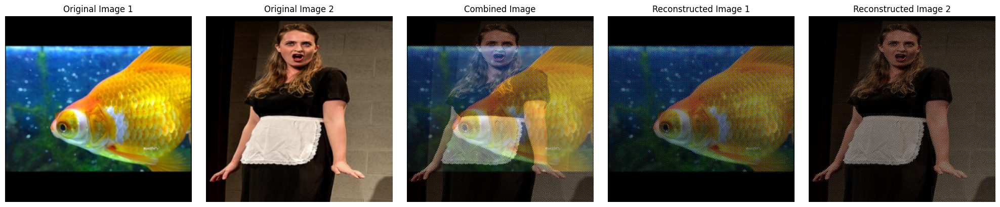

In [3]:
### PIXEL WISE 

# Function to combine images pixel-wise with alternating pattern
def combine_images_pixel_wise(img1: torch.Tensor, img2: torch.Tensor) -> torch.Tensor:
    combined_image_pixel_wise = torch.zeros_like(img1)
    combined_image_pixel_wise[:, 0::2, ::2] = img1[:, 0::2, ::2]    # img1 even rows, even cols
    combined_image_pixel_wise[:, 0::2, 1::2] = img2[:, 0::2, 1::2]  # img2 even rows, odd cols
    combined_image_pixel_wise[:, 1::2, ::2] = img2[:, 1::2, ::2]    # img2 odd rows, even cols
    combined_image_pixel_wise[:, 1::2, 1::2] = img1[:, 1::2, 1::2]  # img1 odd rows, odd cols
    return combined_image_pixel_wise

# Function to reconstruct images from combined image
def reconstruct_images_pixel_wise(combined_image_pixel_wise: torch.Tensor) -> Tuple[torch.Tensor, torch.Tensor]:
    img1_reconstructed_pixel_wise = torch.zeros_like(combined_image_pixel_wise)
    img2_reconstructed_pixel_wise = torch.zeros_like(combined_image_pixel_wise)
    img1_reconstructed_pixel_wise[:, 0::2, ::2] = combined_image_pixel_wise[:, 0::2, ::2]
    img2_reconstructed_pixel_wise[:, 0::2, 1::2] = combined_image_pixel_wise[:, 0::2, 1::2]
    img2_reconstructed_pixel_wise[:, 1::2, ::2] = combined_image_pixel_wise[:, 1::2, ::2]
    img1_reconstructed_pixel_wise[:, 1::2, 1::2] = combined_image_pixel_wise[:, 1::2, 1::2]
    return img1_reconstructed_pixel_wise, img2_reconstructed_pixel_wise


combined_image_pixel_wise = combine_images_pixel_wise(img1, img2)
img1_reconstructed_pixel_wise, img2_reconstructed_pixel_wise = reconstruct_images_pixel_wise(combined_image_pixel_wise)

fig, axes = plt.subplots(1, 5, figsize=(20, 4))
plot_image(axes[0], img1, "Original Image 1")
plot_image(axes[1], img2, "Original Image 2")
plot_image(axes[2], combined_image_pixel_wise, "Combined Image")
plot_image(axes[3], img1_reconstructed_pixel_wise, "Reconstructed Image 1")
plot_image(axes[4], img2_reconstructed_pixel_wise, "Reconstructed Image 2")
plt.tight_layout()
plt.show()

In [10]:
import torch

def replace_missing_pixels_with_neighbors(image_tensor: torch.Tensor) -> torch.Tensor:
    # Get the dimensions of the image tensor (channels, height, width)
    channels, height, width = image_tensor.shape
    
    # Make a copy of the image tensor to modify and return
    filled_image = image_tensor.clone()

    # Loop over each pixel in the image
    for i in range(height):
        for j in range(width):
            # Check if the pixel is missing (i.e., all its channels are 0)
            if torch.all(filled_image[:, i, j] == 0):
                # Get the valid neighbors (top, bottom, left, right)
                neighbors = []

                # Top neighbor
                if i - 1 >= 0 and torch.any(filled_image[:, i - 1, j] != 0):
                    neighbors.append(filled_image[:, i - 1, j])

                # Bottom neighbor
                if i + 1 < height and torch.any(filled_image[:, i + 1, j] != 0):
                    neighbors.append(filled_image[:, i + 1, j])

                # Left neighbor
                if j - 1 >= 0 and torch.any(filled_image[:, i, j - 1] != 0):
                    neighbors.append(filled_image[:, i, j - 1])

                # Right neighbor
                if j + 1 < width and torch.any(filled_image[:, i, j + 1] != 0):
                    neighbors.append(filled_image[:, i, j + 1])

                # If valid neighbors are found, calculate the average and replace the missing pixel
                if neighbors:
                    filled_image[:, i, j] = torch.mean(torch.stack(neighbors), dim=0)
    
    return filled_image


In [4]:
# updated function
def replace_missing_pixels_with_neighbors(image_tensor: torch.Tensor, secret_image_number: int) -> torch.Tensor:
    channels, height, width = image_tensor.shape
    filled_image = image_tensor.clone()
    
    for i in range(height):
        for j in range(width):
            # Determine if the current pixel should be processed based on secret_image_number
            if secret_image_number == 1:
                if (i % 2 == 0 and j % 2 == 0) or (i % 2 == 1 and j % 2 == 1):
                    continue  # Skip pixels not matching the pattern
            elif secret_image_number == 2:
                if (i % 2 == 0 and j % 2 == 1) or (i % 2 == 1 and j % 2 == 0):
                    continue  # Skip pixels not matching the pattern

            # Proceed with filling only if the pixel is zero (missing)
            if torch.all(filled_image[:, i, j] == 0):
                neighbors = []
                
                # Collect non-zero neighboring pixels
                if i - 1 >= 0 and torch.any(filled_image[:, i - 1, j] != 0):
                    neighbors.append(filled_image[:, i - 1, j])
                if i + 1 < height and torch.any(filled_image[:, i + 1, j] != 0):
                    neighbors.append(filled_image[:, i + 1, j])
                if j - 1 >= 0 and torch.any(filled_image[:, i, j - 1] != 0):
                    neighbors.append(filled_image[:, i, j - 1])
                if j + 1 < width and torch.any(filled_image[:, i, j + 1] != 0):
                    neighbors.append(filled_image[:, i, j + 1])
                
                # Fill the pixel with the mean of neighbors if available
                if neighbors:
                    filled_image[:, i, j] = torch.mean(torch.stack(neighbors), dim=0)
    
    return filled_image

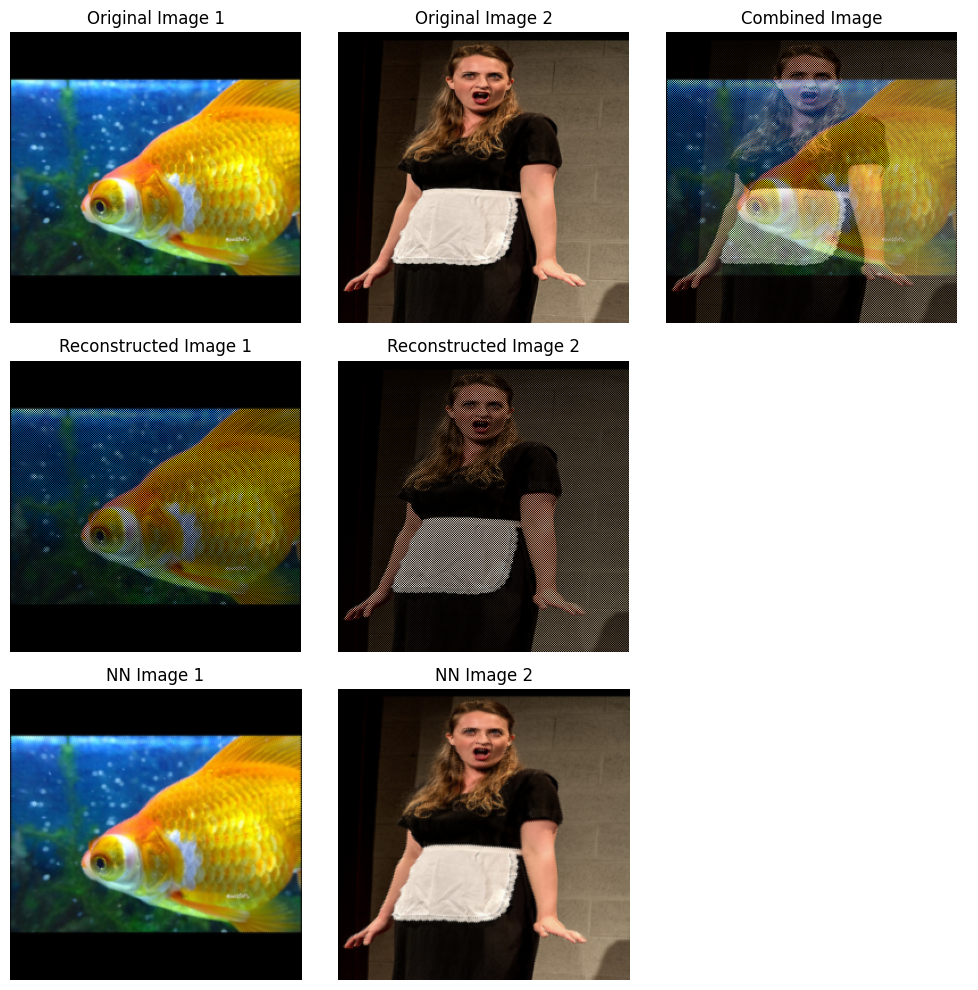

In [9]:
img1_NN_refined_pixel_wise = replace_missing_pixels_with_neighbors(img1_reconstructed_pixel_wise, 1)
img2_NN_refined_pixel_wise = replace_missing_pixels_with_neighbors(img2_reconstructed_pixel_wise, 2)

fig, axes = plt.subplots(3, 3, figsize=(10, 10))
plot_image(axes[0][0], img1, "Original Image 1")
plot_image(axes[0][1], img2, "Original Image 2")
plot_image(axes[0][2], combined_image_pixel_wise, "Combined Image")
plot_image(axes[1][0], img1_reconstructed_pixel_wise, "Reconstructed Image 1")
plot_image(axes[1][1], img2_reconstructed_pixel_wise, "Reconstructed Image 2")
plot_image(axes[2][0], img1_NN_refined_pixel_wise, "NN Image 1")
plot_image(axes[2][1], img2_NN_refined_pixel_wise, "NN Image 2")

# Hide the empty subplots
for ax in axes.flat:
    if not ax.has_data():
        ax.axis('off')  # Turn off the axis

plt.tight_layout()
plt.show()


In [18]:
arnold_const = 2
#Arnold and Revers Arnold
def arnold_transform_tensor(image_tensor: torch.Tensor, iterations: int = 1) -> torch.Tensor:
    N = image_tensor.shape[1]  
    transformed_image = image_tensor.clone()
    for _ in range(iterations):
        new_image = torch.zeros_like(transformed_image)
        for x in range(N):
            for y in range(N):
                x_new = (x + y) % N
                y_new = (x + arnold_const * y) % N
                new_image[:, x_new, y_new] = transformed_image[:, x, y]
        transformed_image = new_image.clone()
    return transformed_image

def reverse_arnold_transform_tensor(image_tensor: torch.Tensor, iterations: int = 1) -> torch.Tensor:
    N = image_tensor.shape[1]  
    transformed_image = image_tensor.clone()
    for _ in range(iterations):
        new_image = torch.zeros_like(transformed_image)
        for x in range(N):
            for y in range(N):
                x_new = (arnold_const * x - y) % N
                y_new = (-x + y) % N
                new_image[:, x_new, y_new] = transformed_image[:, x, y]
        transformed_image = new_image.clone()
    return transformed_image

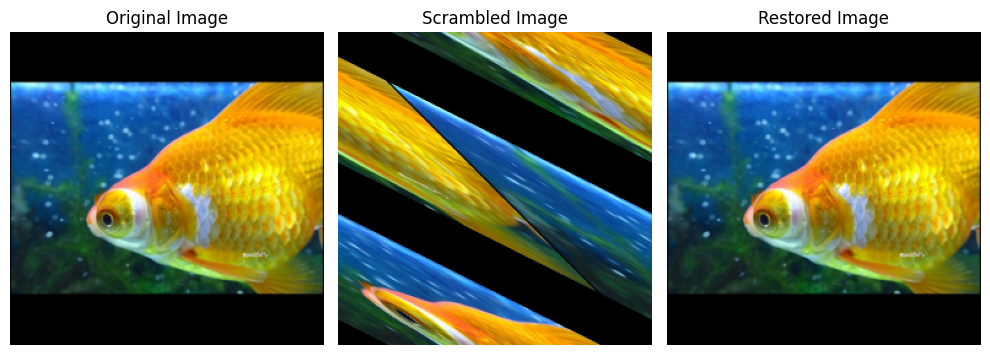

In [19]:
iterations=1
scrambled_image = arnold_transform_tensor(img1, iterations=1)
restored_image = reverse_arnold_transform_tensor(scrambled_image, iterations=1)

fig, axes = plt.subplots(1, 3, figsize=(10, 10))
plot_image(axes[0], img1, "Original Image")
plot_image(axes[1], scrambled_image, "Scrambled Image")
plot_image(axes[2], restored_image, "Restored Image")

plt.tight_layout()
plt.show()

In [21]:
def calculate_mean_pixel_difference(image1: torch.Tensor, image2: torch.Tensor, absolute: bool = True) -> float:

    # Check if both tensors have the same shape
    if image1.shape != image2.shape:
        raise ValueError("Error: Tensors must have the same shape.")

    # Calculate the pixel value differences
    difference = image1 - image2
    
    # Calculate mean difference based on the absolute flag
    if absolute:
        mean_difference = torch.mean(torch.abs(difference))
    else:
        mean_difference = torch.mean(difference ** 2)

    return mean_difference.item()  # Convert to a Python float

In [1]:
# Calculate pixel differences
pixel_diff = calculate_mean_pixel_difference(img1, img1_NN_refined_pixel_wise, absolute=False)
print("Pixel Differences Tensor of image 1:", pixel_diff)

# Calculate absolute pixel differences
absolute_diff = calculate_mean_pixel_difference(img1, img1_NN_refined_pixel_wise, absolute=True)
print("Absolute Pixel Differences Tensor of image 1:", absolute_diff)

# Calculate pixel differences
pixel_diff = calculate_mean_pixel_difference(img2, img2_NN_refined_pixel_wise, absolute=False)
print("Pixel Differences Tensor of image 2:", pixel_diff)

# Calculate absolute pixel differences
absolute_diff = calculate_mean_pixel_difference(img2, img2_NN_refined_pixel_wise, absolute=True)
print("Absolute Pixel Differences Tensor of image 2:", absolute_diff)

NameError: name 'calculate_mean_pixel_difference' is not defined

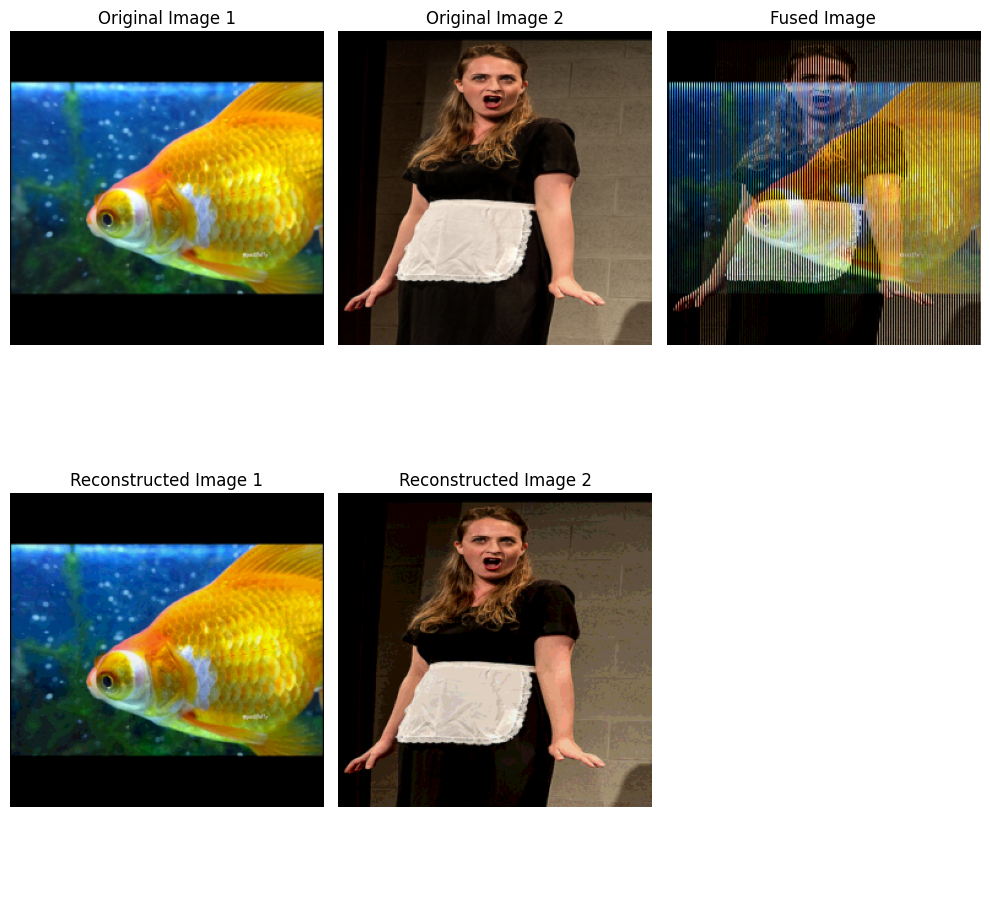

In [29]:
### PIXEL WISE WITH MSB TECHNIQUE- Up until best

import matplotlib.pyplot as plt
import torch
from PIL import Image
import torchvision.transforms as transforms
from typing import Tuple

# Function to load and preprocess images
def load_image(image_path: str, size=(256, 256)) -> torch.Tensor:
    image = Image.open(image_path).convert("RGB")  
    transform = transforms.Compose([
        transforms.Resize(size),
        transforms.ToTensor(),  
    ])
    image_tensor = transform(image) * 255  
    return image_tensor.to(torch.uint8)

# Function to display an image
def plot_image(ax, image: torch.Tensor, title: str):
    image_np = image.permute(1, 2, 0).byte().numpy()  
    ax.imshow(image_np)
    ax.set_title(title)
    ax.axis('off')  

# Combining images using MSB
def combine_images_pixel_wise_msb(img1: torch.Tensor, img2: torch.Tensor) -> torch.Tensor:
    img1 = img1.to(torch.uint8)
    img2 = img2.to(torch.uint8)
    combined_image_pixel_wise = torch.zeros_like(img1)
    img1_msb = img1 & 0xF0  # Most significant 4 bits of img1
    img2_msb = img2 & 0xF0  # Most significant 4 bits of img2
    combined_image_pixel_wise[:, ::2, ::2] = (img1_msb[:, ::2, ::2] | (img2_msb[:, ::2, ::2] >> 4))         # img1 MSBs in MSBs, img2 MSBs in LSBs
    combined_image_pixel_wise[:, ::2, 1::2] = (img2_msb[:, ::2, 1::2] | (img1_msb[:, ::2, 1::2] >> 4))      # img2 MSBs in MSBs, img1 MSBs in LSBs
    combined_image_pixel_wise[:, 1::2, ::2] = (img1_msb[:, 1::2, ::2] | (img2_msb[:, 1::2, ::2] >> 4))      # img1 MSBs in MSBs, img2 MSBs in LSBs
    combined_image_pixel_wise[:, 1::2, 1::2] = (img2_msb[:, 1::2, 1::2] | (img1_msb[:, 1::2, 1::2] >> 4))   # img2 MSBs in MSBs, img1 MSBs in LSBs
    return combined_image_pixel_wise

# Reconstructing images from combined image
def reconstruct_images_pixel_wise_msb(combined_image_pixel_wise: torch.Tensor) -> Tuple[torch.Tensor, torch.Tensor]:
    combined_image_pixel_wise = combined_image_pixel_wise.to(torch.uint8)
    img1_reconstructed_pixel_wise = torch.zeros_like(combined_image_pixel_wise)
    img2_reconstructed_pixel_wise = torch.zeros_like(combined_image_pixel_wise)
    img1_reconstructed_pixel_wise[:, ::2, ::2] = combined_image_pixel_wise[:, ::2, ::2] & 0xF0              # Get img1 MSBs
    img1_reconstructed_pixel_wise[:, ::2, 1::2] = (combined_image_pixel_wise[:, ::2, 1::2] & 0x0F) << 4     # Get img1 LSBs
    img2_reconstructed_pixel_wise[:, ::2, ::2] = (combined_image_pixel_wise[:, ::2, ::2] & 0x0F) << 4       # Get img2 MSBs
    img2_reconstructed_pixel_wise[:, ::2, 1::2] = combined_image_pixel_wise[:, ::2, 1::2] & 0xF0            # Get img2 MSBs
    img1_reconstructed_pixel_wise[:, 1::2, ::2] = combined_image_pixel_wise[:, 1::2, ::2] & 0xF0            # Get img1 MSBs
    img1_reconstructed_pixel_wise[:, 1::2, 1::2] = (combined_image_pixel_wise[:, 1::2, 1::2] & 0x0F) << 4   # Get img1 LSBs
    img2_reconstructed_pixel_wise[:, 1::2, ::2] = (combined_image_pixel_wise[:, 1::2, ::2] & 0x0F) << 4     # Get img2 MSBs
    img2_reconstructed_pixel_wise[:, 1::2, 1::2] = combined_image_pixel_wise[:, 1::2, 1::2] & 0xF0          # Get img2 MSBs
    return img1_reconstructed_pixel_wise, img2_reconstructed_pixel_wise

# Main program to fuse and reconstruct images
def fuse_and_reconstruct_images(image_path1: str, image_path2: str):
    img1 = load_image(image_path1)
    img2 = load_image(image_path2)
    fused_image = combine_images_pixel_wise_msb(img1, img2)
    img1_reconstructed, img2_reconstructed = reconstruct_images_pixel_wise_msb(fused_image)

    fig, axes = plt.subplots(2, 3, figsize=(10, 10))
    plot_image(axes[0][0], img1, "Original Image 1")
    plot_image(axes[0][1], img2, "Original Image 2")
    plot_image(axes[0][2], fused_image, "Fused Image")
    plot_image(axes[1][0], img1_reconstructed, "Reconstructed Image 1")
    plot_image(axes[1][1], img2_reconstructed, "Reconstructed Image 2")
    # Hide the empty subplots
    for ax in axes.flat:
        if not ax.has_data():
            ax.axis('off')  # Turn off the axis

    plt.tight_layout()
    plt.show()
    return img1_reconstructed, img2_reconstructed


image_path1 = './original_images/fuse1.JPEG'
image_path2 = './original_images/fuse2.JPEG'
img1_reconstructed, img2_reconstructed = fuse_and_reconstruct_images(image_path1, image_path2)

In [28]:
# Calculate pixel differences
pixel_diff = calculate_mean_pixel_difference(img1, img1_reconstructed, absolute=False)
print("Pixel Differences Tensor of image 1:", pixel_diff)

# Calculate absolute pixel differences
absolute_diff = calculate_mean_pixel_difference(img1, img1_reconstructed, absolute=True)
print("Absolute Pixel Differences Tensor of image 1:", absolute_diff)

# Calculate pixel differences
pixel_diff = calculate_mean_pixel_difference(img2, img2_reconstructed, absolute=False)
print("Pixel Differences Tensor of image 2:", pixel_diff)

# Calculate absolute pixel differences
absolute_diff = calculate_mean_pixel_difference(img2, img2_reconstructed, absolute=True)
print("Absolute Pixel Differences Tensor of image 2:", absolute_diff)

Pixel Differences Tensor of image 1: 63.755069732666016
Absolute Pixel Differences Tensor of image 1: 9853.1455078125
Pixel Differences Tensor of image 2: 64.11420440673828
Absolute Pixel Differences Tensor of image 2: 8882.9853515625


In [24]:
# Refinement functions

# Function to apply Gaussian smoothing
def apply_gaussian_smoothing(image: torch.Tensor, kernel_size: int = 3, sigma: float = 1.0) -> torch.Tensor:
    gaussian_blur = T.GaussianBlur(kernel_size=kernel_size, sigma=sigma)
    smoothed_image = gaussian_blur(image)
    return smoothed_image

# Function to apply Bilinear Interpolation
def apply_bilinear_interpolation(image: torch.Tensor, scale_factor: float = 1.0) -> torch.Tensor:
    if scale_factor != 1.0:
        image = F.interpolate(image.unsqueeze(0), scale_factor=scale_factor, mode='bilinear', align_corners=True)
        image = F.interpolate(image, size=(256, 256), mode='bilinear', align_corners=True)  # Resize back to original
        return image.squeeze(0)  # Remove batch dimension
    return image

#bicubid interpollation
def apply_bicubic_interpolation(image: torch.Tensor, scale_factor: float = 1.0, target_size: Tuple[int, int] = None) -> torch.Tensor:
    image = image.unsqueeze(0)  # Add batch dimension (1, C, H, W)
    if target_size is not None:
        # Resize image to the target size using bicubic interpolation
        resized_image = F.interpolate(image, size=target_size, mode='bicubic', align_corners=True)
    else:
        # Resize image using the scale factor with bicubic interpolation
        resized_image = F.interpolate(image, scale_factor=scale_factor, mode='bicubic', align_corners=True)
    return resized_image.squeeze(0)  # Remove batch dimension

# Function to apply Median Filtering
def apply_median_filtering(image: torch.Tensor, kernel_size: int = 3) -> torch.Tensor:
    image = image.unsqueeze(0)  # Add batch dimension
    median_filtered_image = F.median_blur(image, kernel_size=kernel_size)
    return median_filtered_image.squeeze(0)  # Remove batch dimension

# Function to apply Laplacian Sharpening
def apply_laplacian_sharpening(image: torch.Tensor) -> torch.Tensor:
    laplacian_kernel = torch.tensor([[0, -1, 0],
                                     [-1, 4, -1],
                                     [0, -1, 0]]).float().unsqueeze(0).unsqueeze(0)
    laplacian_kernel = laplacian_kernel.to(image.device)  # Move kernel to the same device as image
    channels = []
    for c in range(image.size(0)):  # Apply the filter to each channel
        channel = image[c:c+1].unsqueeze(0)  # Add batch and channel dimension
        channel_filtered = F.conv2d(channel, laplacian_kernel, padding=1)
        channels.append(channel_filtered)
    sharpened_image = torch.cat(channels, dim=1).squeeze(0)  # Combine channels and remove batch dimension
    # Add the sharpened details back to the original image
    sharpened_image = torch.clamp(image + sharpened_image, 0, 1)
    return sharpened_image

# Function to apply Super-Resolution (Using a Pre-Trained Model)
def apply_super_resolution(image: torch.Tensor, upscale_factor: int = 2) -> torch.Tensor:
    # Load a pre-trained super-resolution model
    model = models.srresnet(pretrained=True)
    model.eval()  # Set the model to evaluation mode
    with torch.no_grad():
        image_upscaled = model(image.unsqueeze(0))
    return image_upscaled.squeeze(0)  # Remove batch dimension


In [25]:
# Function to adjust the brightness of an image
def adjust_brightness(image: torch.Tensor, brightness_factor: float) -> torch.Tensor:
    """
    Adjust the brightness of the given image.

    :param image: Input image tensor of shape (C, H, W).
    :param brightness_factor: A factor to adjust brightness. Should be > 1 to increase brightness, < 1 to decrease.
    :return: Brightness adjusted image tensor.
    """
    # Clamp the pixel values to stay within the valid range [0, 1]
    brightened_image = torch.clamp(image * brightness_factor, 0, 1)
    return brightened_image

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.072247766..0.98071307].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.098299876..0.98549277].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09880882..0.9705814].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.112795964..0.9413898].


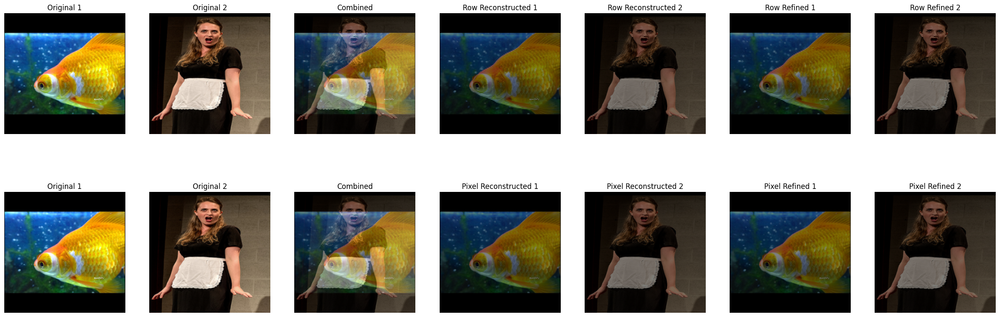

In [26]:
# Apply Gaussian smoothing to the reconstructed images

img1_reconstructed_row_wise_bicubic_interpolation = apply_bicubic_interpolation(img1_reconstructed_row_wise, scale_factor=2.0)
img2_reconstructed_row_wise_bicubic_interpolation = apply_bicubic_interpolation(img2_reconstructed_row_wise, scale_factor=2.0)

img1_reconstructed_pixel_wise_bicubic_interpolation = apply_bicubic_interpolation(img1_reconstructed_pixel_wise, scale_factor=2.0)
img2_reconstructed_pixel_wise_bicubic_interpolation = apply_bicubic_interpolation(img2_reconstructed_pixel_wise, scale_factor=2.0)

brightness_factor=1.5

# img1_reconstructed_row_wise_bicubic_interpolation = adjust_brightness(apply_bicubic_interpolation(img1_reconstructed_row_wise, scale_factor=2.0),brightness_factor)
# img2_reconstructed_row_wise_bicubic_interpolation = adjust_brightness(apply_bicubic_interpolation(img2_reconstructed_row_wise, scale_factor=2.0),brightness_factor)

img1_reconstructed_pixel_wise_bicubic_interpolation_brightned = adjust_brightness(apply_bicubic_interpolation(img1_reconstructed_pixel_wise, scale_factor=2.0),brightness_factor)
img2_reconstructed_pixel_wise_bicubic_interpolation_brightned = adjust_brightness(apply_bicubic_interpolation(img2_reconstructed_pixel_wise, scale_factor=2.0),brightness_factor)

# Plot images in a row
fig, axes = plt.subplots(2, 7, figsize=(30, 10))

# Plot each image with its title
plot_image(axes[0, 0], img1, "Original 1")
plot_image(axes[0, 1], img2, "Original 2")
plot_image(axes[0, 2], combined_image_row_wise, "Combined")
plot_image(axes[0, 3], img1_reconstructed_row_wise, "Row Reconstructed 1")
plot_image(axes[0, 4], img2_reconstructed_row_wise, "Row Reconstructed 2")
plot_image(axes[0, 5], img1_reconstructed_row_wise_bicubic_interpolation, "Row Refined 1")
plot_image(axes[0, 6], img2_reconstructed_row_wise_bicubic_interpolation, "Row Refined 2")

plot_image(axes[1, 0], img1, "Original 1")
plot_image(axes[1, 1], img2, "Original 2")
plot_image(axes[1, 2], combined_image_pixel_wise, "Combined")
plot_image(axes[1, 3], img1_reconstructed_pixel_wise, "Pixel Reconstructed 1")
plot_image(axes[1, 4], img2_reconstructed_pixel_wise, "Pixel Reconstructed 2")
plot_image(axes[1, 5], img1_reconstructed_pixel_wise_bicubic_interpolation, "Pixel Refined 1")
plot_image(axes[1, 6], img2_reconstructed_pixel_wise_bicubic_interpolation, "Pixel Refined 2")

plt.show()


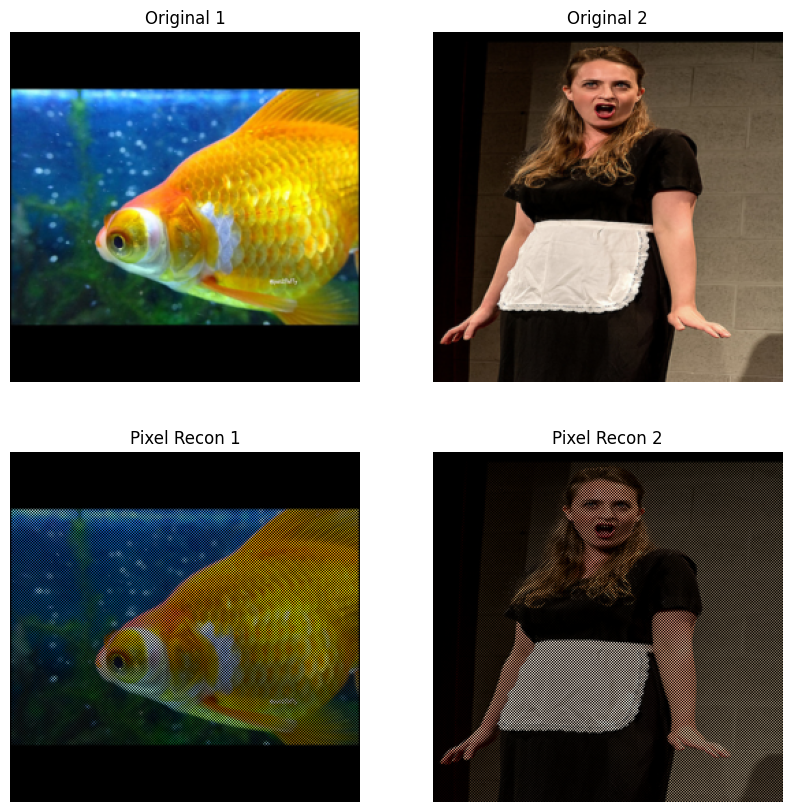

In [27]:
fig, axes = plt.subplots(2, 2, figsize=(10, 10))
plot_image(axes[0,0], img1, "Original 1")
plot_image(axes[0,1], img2, "Original 2")
plot_image(axes[1,0], img1_reconstructed_pixel_wise, "Pixel Recon 1")
plot_image(axes[1,1], img2_reconstructed_pixel_wise, "Pixel Recon 2")

plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09880882..0.9705814].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.112795964..0.9413898].


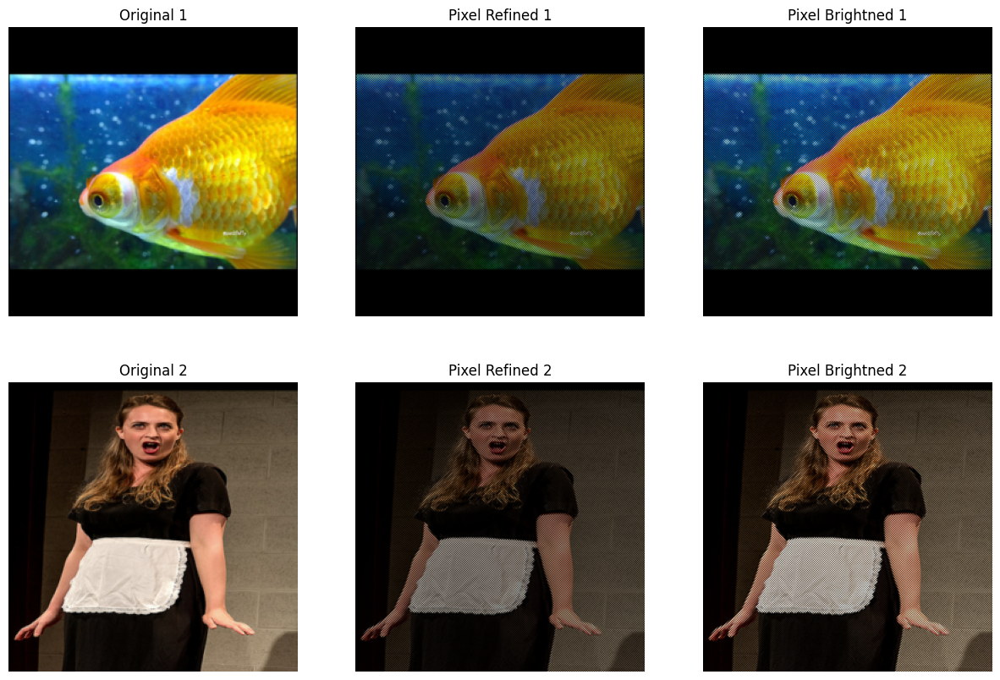

In [28]:
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
plot_image(axes[0,0], img1, "Original 1")
plot_image(axes[1,0], img2, "Original 2")
plot_image(axes[0,1], img1_reconstructed_pixel_wise_bicubic_interpolation, "Pixel Refined 1")
plot_image(axes[1,1], img2_reconstructed_pixel_wise_bicubic_interpolation, "Pixel Refined 2")
plot_image(axes[0,2], img1_reconstructed_pixel_wise_bicubic_interpolation_brightned, "Pixel Brightned 1")
plot_image(axes[1,2], img2_reconstructed_pixel_wise_bicubic_interpolation_brightned, "Pixel Brightned 2")

plt.show()

In [29]:
# GAUSIAN SMOOTHING

def apply_gaussian_smoothing(image: torch.Tensor, kernel_size: int = 3, sigma: float = 2.0) -> torch.Tensor:
    gaussian_blur = T.GaussianBlur(kernel_size=kernel_size, sigma=sigma)
    smoothed_image = gaussian_blur(image)
    return smoothed_image

img1_reconstructed_pixel_wise_gausian = apply_gaussian_smoothing(img1_reconstructed_pixel_wise, kernel_size=3)
img2_reconstructed_pixel_wise_gausian = apply_gaussian_smoothing(img2_reconstructed_pixel_wise, kernel_size=3)

In [30]:
#BICUBIC INTERPOLATION

def apply_bicubic_interpolation(image: torch.Tensor, scale_factor: float = 1.0, target_size: Tuple[int, int] = None) -> torch.Tensor:
    image = image.unsqueeze(0) 
    if target_size is not None:
        resized_image = F.interpolate(image, size=target_size, mode='bicubic', align_corners=True)
    else:
        resized_image = F.interpolate(image, scale_factor=scale_factor, mode='bicubic', align_corners=True)
    return resized_image.squeeze(0) 

img1_reconstructed_pixel_wise_bicubic_interpolation = apply_bicubic_interpolation(img1_reconstructed_pixel_wise, scale_factor=2.0)
img2_reconstructed_pixel_wise_bicubic_interpolation = apply_bicubic_interpolation(img2_reconstructed_pixel_wise, scale_factor=2.0)

In [31]:
# BILINEAR INTERPOLATION

def apply_bilinear_interpolation(image: torch.Tensor, scale_factor: float = 1.0) -> torch.Tensor:
    if scale_factor != 1.0:
        image = F.interpolate(image.unsqueeze(0), scale_factor=scale_factor, mode='bilinear', align_corners=True)
        image = F.interpolate(image, size=(256, 256), mode='bilinear', align_corners=True)  # Resize back to original
        return image.squeeze(0)  # Remove batch dimension
    return image

img1_reconstructed_pixel_wise_bilinear_interpolation = apply_bilinear_interpolation(img1_reconstructed_pixel_wise, scale_factor=2.0)
img2_reconstructed_pixel_wise_bilinear_interpolation = apply_bilinear_interpolation(img2_reconstructed_pixel_wise, scale_factor=2.0)

In [32]:
# MEDIAN FILTERING

def apply_median_filtering(image: torch.Tensor, kernel_size: int = 3) -> torch.Tensor:
    # Convert tensor to PIL image for filtering
    pil_image = F.to_pil_image(image)
    
    # Apply median filtering
    median_filtered_image = pil_image.filter(ImageFilter.MedianFilter(size=kernel_size))
    
    # Convert back to tensor
    median_filtered_image = F.to_tensor(median_filtered_image)
    
    return median_filtered_image

img1_reconstructed_pixel_wise_median_filtering = apply_median_filtering(img1_reconstructed_pixel_wise, kernel_size=3)
img2_reconstructed_pixel_wise_median_filtering = apply_median_filtering(img2_reconstructed_pixel_wise, kernel_size=3)

AttributeError: module 'torch.nn.functional' has no attribute 'to_pil_image'

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09880882..0.9705814].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.112795964..0.9413898].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09880882..0.9705814].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.112795964..0.9413898].


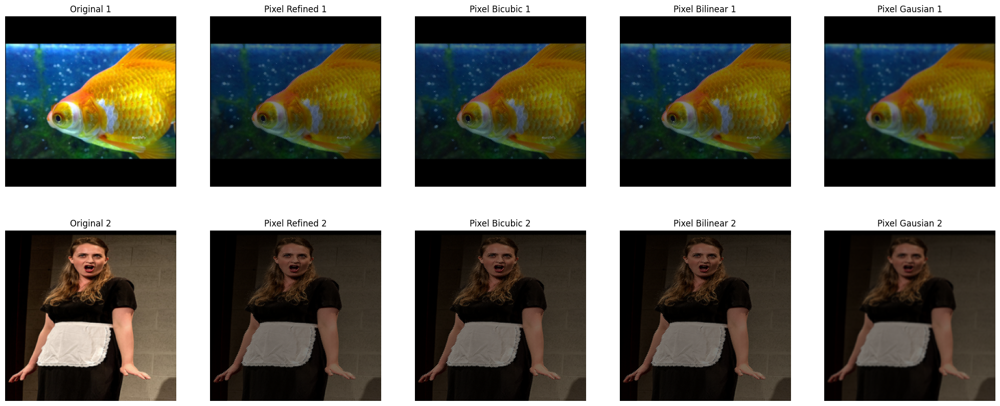

In [33]:
fig, axes = plt.subplots(2, 5, figsize=(25, 10))
plot_image(axes[0,0], img1, "Original 1")
plot_image(axes[1,0], img2, "Original 2")
plot_image(axes[0,1], img1_reconstructed_pixel_wise, "Pixel Refined 1")
plot_image(axes[1,1], img2_reconstructed_pixel_wise, "Pixel Refined 2")
plot_image(axes[0,2], img1_reconstructed_pixel_wise_bicubic_interpolation, "Pixel Bicubic 1")
plot_image(axes[1,2], img2_reconstructed_pixel_wise_bicubic_interpolation, "Pixel Bicubic 2")
plot_image(axes[0,3], img1_reconstructed_pixel_wise_bicubic_interpolation, "Pixel Bilinear 1")
plot_image(axes[1,3], img2_reconstructed_pixel_wise_bicubic_interpolation, "Pixel Bilinear 2")
plot_image(axes[0,4], img1_reconstructed_pixel_wise_gausian, "Pixel Gausian 1")
plot_image(axes[1,4], img2_reconstructed_pixel_wise_gausian, "Pixel Gausian 2")

plt.show()

In [37]:


# Paths to your images
image_path1 = './original_images/fuse1.JPEG'
image_path2 = './original_images/fuse2.JPEG'
img1, img2 = preprocess_images(image_path1, image_path2)

# Combine the images using pixel-wise separation
combined_image = combine_images_pixelwise(img1, img2)

# Reconstruct the original images
img1_reconstructed, img2_reconstructed = reconstruct_images_pixelwise(combined_image)

# Apply Gaussian smoothing to the reconstructed images
img1_reconstructed_gausian = apply_gaussian_smoothing(img1_reconstructed, kernel_size=5)
img2_reconstructed_gausian = apply_gaussian_smoothing(img2_reconstructed, kernel_size=5)

# Apply Bilinear Interpolation to the reconstructed images
img1_reconstructed_bilinear = apply_bilinear_interpolation(img1_reconstructed, scale_factor=1.5)
img2_reconstructed_bilinear = apply_bilinear_interpolation(img2_reconstructed, scale_factor=1.5)

# Apply Median Filtering to the reconstructed images
img1_reconstructed_median = apply_median_filtering(img1_reconstructed, kernel_size=3)
img2_reconstructed_median = apply_median_filtering(img2_reconstructed, kernel_size=3)

# Apply Laplacian Sharpening to the reconstructed images
img1_reconstructed_laplacian = apply_laplacian_sharpening(img1_reconstructed)
img2_reconstructed_laplacian = apply_laplacian_sharpening(img2_reconstructed)

# Plot the images in a row
fig, axes = plt.subplots(1, 7, figsize=(20, 5))

# Define a function to display an image on a given axis
def plot_image(ax, image: torch.Tensor, title: str):
    image_np = image.squeeze().detach().numpy()
    image_np = image_np.transpose(1, 2, 0)  # (C, H, W) -> (H, W, C)
    ax.imshow(image_np)
    ax.set_title(title)
    ax.axis('off')

# Plot images in the first row
plot_image(axes[0], img1, "Original Image 1")
plot_image(axes[1], img2, "Original Image 2")
plot_image(axes[2], combined_image, "Combined Image")
plot_image(axes[3], img1_reconstructed, "Reconstructed Image 1")
plot_image(axes[4], img2_reconstructed, "Reconstructed Image 2")
plot_image(axes[5], img1_reconstructed_gausian, "Gausian Refined Image 1")
plot_image(axes[6], img2_reconstructed_gausian, "Gausian Refined Image 2")

# Plot images in the first row
plot_image(axes[0, 0], img1, "Original Image 1")
plot_image(axes[0, 1], img2, "Original Image 2")
plot_image(axes[0, 2], combined_image, "Combined Image")
plot_image(axes[0, 3], img1_reconstructed, "Reconstructed Image 1")
plot_image(axes[0, 4], img2_reconstructed, "Reconstructed Image 2")
plot_image(axes[0, 5], img1_reconstructed_gausian, "Gausian Refined Image 1")
plot_image(axes[0, 6], img2_reconstructed_gausian, "Gausian Refined Image 2")

# Plot images in the second row (you can replace these with other images if needed)
plot_image(axes[1, 0], img1, "Original Image 1")
plot_image(axes[1, 1], img2, "Original Image 2")
plot_image(axes[1, 2], combined_image, "Combined Image")
plot_image(axes[1, 3], img1_reconstructed, "Reconstructed Image 1")
plot_image(axes[1, 4], img2_reconstructed, "Reconstructed Image 2")
plot_image(axes[1, 5], img1_reconstructed_median, "Median Refined Image 1")
plot_image(axes[1, 6], img1_reconstructed_median, "Median Refined Image 2")

# Plot images in the second row (you can replace these with other images if needed)
plot_image(axes[2, 0], img1, "Original Image 1")
plot_image(axes[2, 1], img2, "Original Image 2")
plot_image(axes[2, 2], combined_image, "Combined Image")
plot_image(axes[2, 3], img1_reconstructed, "Reconstructed Image 1")
plot_image(axes[2, 4], img2_reconstructed, "Reconstructed Image 2")
plot_image(axes[2, 5], img1_reconstructed_bilinear, "Bilinear Refined Image 1")
plot_image(axes[2, 6], img2_reconstructed_bilinear, "Bilinear Refined Image 2")

# Plot images in the second row (you can replace these with other images if needed)
plot_image(axes[3, 0], img1, "Original Image 1")
plot_image(axes[3, 1], img2, "Original Image 2")
plot_image(axes[3, 2], combined_image, "Combined Image")
plot_image(axes[3, 3], img1_reconstructed, "Reconstructed Image 1")
plot_image(axes[3, 4], img2_reconstructed, "Reconstructed Image 2")
plot_image(axes[3, 5], img1_reconstructed_laplacian, "Laplacian Refined Image 1")
plot_image(axes[3, 6], img2_reconstructed_laplacian, "Laplacian Refined Image 2")

plt.show()




Shape of Image 1:  (500, 500)
Shape of Image 2:  (324, 500)
Shape of Reshaped Image 1:  torch.Size([3, 256, 256])
Shape of Reshaped Image 2:  torch.Size([3, 256, 256])


NameError: name 'combine_images_pixelwise' is not defined

In [35]:
def tensor_to_image(image_tensor: torch.Tensor) -> Image:
    image_np = image_tensor.squeeze().detach().numpy()
    image_np = image_np.transpose(1, 2, 0)  # (C, H, W) -> (H, W, C)
    image_np = (image_np * 255).astype("uint8")  # Scale to [0, 255] and convert to uint8
    return Image.fromarray(image_np)

# Convert tensors to PIL images
img1_pil = tensor_to_image(img1)
img2_pil = tensor_to_image(img2)
combined_image_pil = tensor_to_image(combined_image)
img1_reconstructed_pil = tensor_to_image(img1_reconstructed)
img2_reconstructed_pil = tensor_to_image(img2_reconstructed)
img1_refined_pil = tensor_to_image(img1_reconstructed_gausian)
img2_refined_pil = tensor_to_image(img2_reconstructed_gausian)

# Save the images
img1_pil.save("./results/img1.png")
img2_pil.save("./results/img2.png")
combined_image_pil.save("./results/combined_image.png")
img1_reconstructed_pil.save("./results/img1_reconstructed.png")
img2_reconstructed_pil.save("./results/img2_reconstructed.png")
img1_refined_pil.save("./results/img1_refined.png")
img2_refined_pil.save("./results/img2_refined.png")

NameError: name 'combined_image' is not defined